In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [2]:
#Melakukan Setting display max_rows dan max_columns DataFrame
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", 220)

In [3]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')

C:\Users\Elga Ridho Maulana\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
df.shape

(181691, 135)

Terdapat 180K lebih baris dan terdapat 135 kolom. Jumlah Kolom yang sangat banyak. Kita harus terlebih dahulu melihat setiap kolom dari dataset ini.
Apakah semua kolom diperlukan untuk melakukan analisis lebih lanjut?
Atau terdapat kolom-kolom yang sebenarnya tidak terlalu dibutuhkan untuk melakukan analisis lebih lanjut.

In [5]:
df.head(3)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


## Pemilihan Kolom Untuk digunakan Dalam Analisis

Kolom dengan jumlah <b>Missing Value</b> yang terlalu banyak akan sangat sulit untuk dianalisis. Dalam kasus ini, kolom dengan Missing Value <b>lebih dari 50 %</b> akan kita drop.

In [6]:
# Menentukan percent data yang kosong untuk setiap kolom
len_df = len(df)
percent_null = []
for item in df.columns:
    count_null = df[item].isnull().sum()
    percent_null.append(count_null/len_df*100)

In [7]:
percent_column_null = pd.DataFrame({'column_name':df.columns, 'percent_null(%)':percent_null})
percent_column_null

,column_name,percent_null(%)
0,eventid,0.000000
1,iyear,0.000000
2,imonth,0.000000
3,iday,0.000000
4,approxdate,94.914993
5,extended,0.000000
6,resolution,98.778145
7,country,0.000000
8,country_txt,0.000000
9,region,0.000000


Banyak kolom yang ternyata memiliki Missing Value lebih dari 50%, Bahkan ada yang lebih dari 90%. Kita tidak akan menggunakan kolom-kolom ini.

In [8]:
#Drop kolom Missing Value > 50%
column_to_drop = []
for i in range(len(percent_column_null)):
    if percent_column_null['percent_null(%)'][i] > 50:
        column_to_drop.append(percent_column_null['column_name'][i])

In [9]:
df2 = df.drop(column_to_drop, axis=1)

In [10]:
len(df2.columns)

58

Dari <b>135 kolom</b>, hanya ada <b>58 kolom</b> saja yang nilai missing valuenya tidak lebih dari 50%

Terdapat juga kolom yang sebenarnya menunjukkan nilai yang sama, misalkan kolom country dengan country_txt. Perbedaannya kolom country menunjukkan angka sedangkan country_txt menunjukan nama negaranya. Dalam analisis ini, kita akan menggunakan kolom yang mengandung 'txt' saja.

In [11]:
column_to_drop = []
for element in df2.columns:
    if 'txt' in element:
        column_to_drop.append(element[:-4])
df2.drop(column_to_drop, axis=1, inplace=True)

In [12]:
len(df2.columns)

50

Jumlah kolom yang tersisa tinggal <b>50 kolom</b>. Kolom ini kemudian akan kita pilih lagi sesuai dengan kolom apa saja yang akan digunakan.

In [13]:
df2.head()

,eventid,iyear,imonth,iday,extended,country_txt,region_txt,provstate,city,latitude,longitude,specificity,vicinity,summary,crit1,crit2,crit3,doubtterr,multiple,success,suicide,attacktype1_txt,targtype1_txt,targsubtype1_txt,corp1,target1,natlty1_txt,gname,guncertain1,individual,nperps,nperpcap,claimed,weaptype1_txt,weapsubtype1_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,ishostkid,scite1,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
0,197000000001,1970,7,2,0,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,1,1,1,0.0,0.0,1,0,Assassination,Private Citizens & Property,Named Civilian,NaN,Julio Guzman,Dominican Republic,MANO-D,0.0,0,NaN,NaN,NaN,Unknown,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,0.0,NaN,PGIS,0,0,0,0
1,197000000002,1970,0,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,1,1,1,0.0,0.0,1,0,Hostage Taking (Kidnapping),Government (Diplomatic),"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",Belgium,23rd of September Communist League,0.0,0,7.0,NaN,NaN,Unknown,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,1.0,NaN,PGIS,0,1,1,1
2,197001000001,1970,1,0,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,1,1,1,0.0,0.0,1,0,Assassination,Journalists & Media,Radio Journalist/Staff/Facility,Voice of America,Employee,United States,Unknown,0.0,0,NaN,NaN,NaN,Unknown,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,0.0,NaN,PGIS,-9,-9,1,1
3,197001000002,1970,1,0,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,1,1,1,0.0,0.0,1,0,Bombing/Explosion,Government (Diplomatic),Embassy/Consulate,NaN,U.S. Embassy,United States,Unknown,0.0,0,NaN,NaN,NaN,Explosives,Unknown Explosive Type,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,0.0,NaN,PGIS,-9,-9,1,1
4,197001000003,1970,1,0,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,1.0,0,NaN,1,1,1,-9.0,0.0,1,0,Facility/Infrastructure Attack,Government (Diplomatic),Embassy/Consulate,NaN,U.S. Consulate,United States,Unknown,0.0,0,NaN,NaN,NaN,Incendiary,NaN,Incendiary,NaN,NaN,NaN,NaN,NaN,NaN,1,0.0,NaN,PGIS,-9,-9,1,1


In [14]:
df2.tail()

,eventid,iyear,imonth,iday,extended,country_txt,region_txt,provstate,city,latitude,longitude,specificity,vicinity,summary,crit1,crit2,crit3,doubtterr,multiple,success,suicide,attacktype1_txt,targtype1_txt,targsubtype1_txt,corp1,target1,natlty1_txt,gname,guncertain1,individual,nperps,nperpcap,claimed,weaptype1_txt,weapsubtype1_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,ishostkid,scite1,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
181686,201712310022,2017,12,31,0,Somalia,Sub-Saharan Africa,Middle Shebelle,Ceelka Geelow,2.359673,45.385034,2.0,0,12/31/2017: Assailants opened fire on a Somali...,1,1,0,1.0,0.0,1,0,Armed Assault,Military,Military Checkpoint,Somali National Army (SNA),Checkpoint,Somalia,Al-Shabaab,0.0,0,-99.0,0.0,1.0,Firearms,Unknown Gun Type,NaN,1.0,0.0,0.0,2.0,0.0,0.0,-9,0.0,"""Somalia: Al-Shabaab Militants Attack Army Che...",START Primary Collection,0,0,0,0
181687,201712310029,2017,12,31,0,Syria,Middle East & North Africa,Lattakia,Jableh,35.407278,35.942679,1.0,1,12/31/2017: Assailants launched mortars at the...,1,1,0,1.0,0.0,1,0,Bombing/Explosion,Military,Military Barracks/Base/Headquarters/Checkpost,Russian Air Force,Hmeymim Air Base,Russia,Muslim extremists,0.0,0,-99.0,0.0,0.0,Explosives,"Projectile (rockets, mortars, RPGs, etc.)",Mortars were used in the attack.,2.0,0.0,0.0,7.0,0.0,0.0,1,0.0,"""Putin's 'victory' in Syria has turned into a ...",START Primary Collection,-9,-9,1,1
181688,201712310030,2017,12,31,0,Philippines,Southeast Asia,Maguindanao,Kubentog,6.900742,124.437908,2.0,0,12/31/2017: Assailants set fire to houses in K...,1,1,1,0.0,0.0,1,0,Facility/Infrastructure Attack,Private Citizens & Property,House/Apartment/Residence,Not Applicable,Houses,Philippines,Bangsamoro Islamic Freedom Movement (BIFM),0.0,0,-99.0,0.0,0.0,Incendiary,Arson/Fire,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,"""Maguindanao clashes trap tribe members,"" Phil...",START Primary Collection,0,0,0,0
181689,201712310031,2017,12,31,0,India,South Asia,Manipur,Imphal,24.798346,93.940430,1.0,0,12/31/2017: Assailants threw a grenade at a Fo...,1,1,1,0.0,0.0,0,0,Bombing/Explosion,Government (General),Government Building/Facility/Office,Forest Department Manipur,Office,India,Unknown,0.0,0,-99.0,0.0,0.0,Explosives,Grenade,A thrown grenade was used in the attack.,0.0,0.0,0.0,0.0,0.0,0.0,-9,0.0,"""Trader escapes grenade attack in Imphal,"" Bus...",START Primary Collection,-9,-9,0,-9
181690,201712310032,2017,12,31,0,Philippines,Southeast Asia,Maguindanao,Cotabato City,7.209594,124.241966,1.0,0,12/31/2017: An explosive device was discovered...,1,1,1,0.0,0.0,0,0,Bombing/Explosion,Unknown,NaN,Unknown,Unknown,Philippines,Unknown,0.0,0,-99.0,0.0,0.0,Explosives,Unknown Explosive Type,An explosive device containing a detonating co...,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,"""Security tightened in Cotabato following IED ...",START Primary Collection,-9,-9,0,-9


In [15]:
# Membuat list nama kolom yang digunakan untuk analisis
column_to_use = ['iyear', 'imonth', 'country_txt', 'region_txt', 'provstate', 'city', 'latitude', 'longitude', 'attacktype1_txt',
                'weaptype1_txt', 'targtype1_txt', 'natlty1_txt', 'INT_IDEO', 'success', 'suicide', 'gname', 'individual', 'nkill', 'nwound']

In [16]:
df2 = df[column_to_use]

In [17]:
# Merubah Nama Kolom agar menjadi lebih mudah untuk dipanggil
df2.columns = ['Year', 'Month', 'Country', 'Region', 'Province', 'City', 'Lat', 'Long',
               'AttType', 'Weapon', 'TargetType', 'NatTarget', 'TerNat', 'Success', 'Suicide', 'GroupName', 'Individual', 'NumberKill', 'NumberWound']

In [18]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
Year           181691 non-null int64
Month          181691 non-null int64
Country        181691 non-null object
Region         181691 non-null object
Province       181270 non-null object
City           181257 non-null object
Lat            177135 non-null float64
Long           177134 non-null float64
AttType        181691 non-null object
Weapon         181691 non-null object
TargetType     181691 non-null object
NatTarget      180132 non-null object
TerNat         181691 non-null int64
Success        181691 non-null int64
Suicide        181691 non-null int64
GroupName      181691 non-null object
Individual     181691 non-null int64
NumberKill     171378 non-null float64
NumberWound    165380 non-null float64
dtypes: float64(4), int64(6), object(9)
memory usage: 26.3+ MB


In [19]:
df2.nunique()

Year              47
Month             13
Country          205
Region            12
Province        2855
City           36674
Lat            48322
Long           48039
AttType            9
Weapon            12
TargetType        22
NatTarget        215
TerNat             3
Success            2
Suicide            2
GroupName       3537
Individual         2
NumberKill       205
NumberWound      238
dtype: int64

## Penjelasan Nama Kolom yang Digunakan
Terdapat 19 kolom yang digunakan dalam analisis ini. 19 kolom tersebut adalah sebagai berikut:

<b>Year</b> : Tahun dimana aksi terorisme berlangsung, data yang ada adalah dari tahun 1970 - 2017.

<b>Month</b> : Bulan aksi terosime berlangsung, 0-12, Bulan 0 artinya bulan kejadian berlangsung tidak diketahui.

<b>Country</b> : Nama Negara dimana aksi terorisme berlangsung. Terdapat 205 negara berbeda dalam dataset ini.

<b>Region</b> : Nama Kawasan aksi terorisme berlangsung. Misalkan, Indonesia berada di Kawasan Asia Tenggara (Southeast Asia).

<b>Province</b> : Nama Distrik atau Nama Provinsi kejadian Berlangsung.

<b>City</b> : Nama Kota tempat kejadian berlangsung.

<b>Lat</b> : Latitude atau garis lintang kejadian berlangsung.

<b>Long</b> : Longitude atau garis bujur kejadian berlangsung.

<b>AttType</b> : Kolom bagaimana aksi terorisme dilakukan. Terdapat 9 nilai unik dari kolom ini.

<b>Weapon</b> : Jenis Senjata yang digunakan dalam melakukan aksi. Terdapat 12 jenis senjata unik yang terdapat dalam dataset.

<b>TargetType</b> : Target atau Victim dari aksi yang dilakukan. Terdapat 22 Jenis target yang berbeda.

<b>NatTarget</b> : Kewarganegaraan dari Target yang diserang.

<b>TerNat</b> : Kewarganegaraan dari teroris. 1: berbeda dengan yang diserang, 0: sama dengan yang diserang, -9:tidak diketahui

<b>Success</b> : Aksi terorisme sukses atau tidak. 1: Sukses, 0: Tidak Sukses.

<b>Suicide</b> : 1: Aksi bunuh diri, 2: Bukan aksi bunuh diri.

<b>GroupName</b> : Group atau kelompok yang melakukan aksi terorisme.

<b>Individual</b> : Aksi dilakukan secara individual atau tidak. 1: individual, 0: kelompok

<b>NumberKill</b> : Tindakan terorisme memakan berapa korban jiwa

<b>NumberWound</b> : Tindakan terorisme menyebabkan berapa orang terluka

##  Penanganan Data yang Kosong

In [20]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province         421
City             434
Lat             4556
Long            4557
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

Terdapat data yang kosong dari kolom <b>Province</b> dan <b>City</b>. Kita dapat mengisi data tersebut berdasarkan Latitude dan Longitude-nya.

### Mengisi Missing Value untuk City

In [21]:
#Membuat df_test_city yang merupakan data yang City, Lat, dan Long nya tidak null
df_test_city = df2[(df2['City'].notnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]
#Membuat df_predict_city yang merupakan data yang City-nya kosong, tetapi Lat dan Long nya tidak null
df_predict_city = df2[(df2['City'].isnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]

In [22]:
len(df_predict_city)

426

Nilai data yang City nya kosong tetapi Lat dan Long-nya tidak kosong ada 426 data dari 434 data City yang kosong. Artinya kita dapat mengisi hampir seluruh data City yang kosong.

In [23]:
def fill_city(df):
    lat_diff = np.abs(df['Lat'] - df_test_city['Lat'])
    long_diff = np.abs(df['Long'] - df_test_city['Long'])
    diff = lat_diff+long_diff
    index_min = np.argmin(diff)
    return df_test_city['City'].loc[index_min]

In [24]:
idx_city_change = df_predict_city.index

In [25]:
# Pengisian data city yang kosong menggunakan apply
df2.loc[idx_city_change, 'City'] = df_predict_city.apply(fill_city, axis=1)

C:\Users\Elga Ridho Maulana\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)
C:\Users\Elga Ridho Maulana\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [26]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province         421
City               8
Lat             4556
Long            4557
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

Tersisa 8 data City yang masih kosong. Kita akan drop data tersebut, karena jumlahnya sudah tidak terlalu banyak.

In [27]:
df2 = df2.dropna(subset=['City'])

### Mengisi Missing Value untuk Province

Pengisian Province Hampir sama dengan City, yaitu mencari latitude dan longitude terdekat. Berdasarkan info, nilai missing value untuk province adalah 421.

In [28]:
df_test_province = df2[(df2['Province'].notnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]
df_predict_province = df2[(df2['Province'].isnull()) & (df2['Lat'].notnull()) & (df2['Long'].notnull())]

In [29]:
len(df_predict_province)

409

409 data yang akan diisi dari 421 data Province yang NaN

In [30]:
def fill_province(df):
    lat_diff = np.abs(df['Lat'] - df_test_province['Lat'])
    long_diff = np.abs(df['Long'] - df_test_province['Long'])
    diff = lat_diff+long_diff
    index_min = np.argmin(diff)
    return df_test_province['Province'].loc[index_min]

In [31]:
idx_prov_change = df_predict_province.index

In [32]:
df2.loc[idx_prov_change, 'Province'] = df_predict_province.apply(fill_province, axis=1)

In [33]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province          12
City               0
Lat             4548
Long            4549
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10313
NumberWound    16311
dtype: int64

Sama halnya dengan data city, data Province yang masih kosong juga akan kita drop.

In [34]:
df2 = df2.dropna(subset=['Province'])

### Mengisi Lat dan Long

In [35]:
df2[df2.Lat.isnull()]['City'].value_counts()

Unknown                     2239
unknown                       46
Nationwide                    24
Nationwide*                   17
Puerto Rico                   14
Pan American Highway          11
Silla de Oro                   9
Carmen                         8
Zahrani                        8
Ronguyocc Alto                 8
Sungai Kolok                   8
Santa Cruz                     7
Northern trunk highway         7
Los Chiles                     7
El Zapote                      7
La Trinidad                    6
Bongabong                      5
Guadalupe                      5
San Andres                     5
Catarman                       5
La Palma                       5
El Partido                     5
Lopez                          4
Las Palmas                     4
Las Flores                     4
San Nicolas                    4
Murcia                         4
San Luis                       4
San Isidro                     4
Konsat                         4
Pasig     

In [36]:
df2[df2.Lat.isnull()]['Country'].value_counts()

El Salvador                         472
Colombia                            471
Nicaragua                           398
Philippines                         380
Peru                                288
Turkey                              166
India                               159
Iraq                                149
Lebanon                             145
Algeria                             124
Sri Lanka                           113
Afghanistan                          92
Guatemala                            91
Yemen                                77
South Africa                         77
Bangladesh                           70
Spain                                54
Israel                               54
Cambodia                             53
Pakistan                             50
Chile                                45
Thailand                             42
Nigeria                              41
Myanmar                              37
Senegal                              35


Baris dengan Lat dan Long yang kosong, paling banyak memiliki value City berupa Unknown. Oleh karena itu, kita tidak dapat menggunakan City untuk mengisi Lat dan Long. Sebaliknya, kolom Country semuanya terisi. Sehingga kita dapat mengisi Lat dan Long berdasarkan value dari Country.

In [37]:
mean_lat_country = df2.groupby('Country').mean()['Lat']
mean_long_country = df2.groupby('Country').mean()['Long']

In [38]:
# Membuat fungsi untuk mengisi latitude dan longitude yang kosong dengan mean dari latitude atau longitude dari country tersebut
def func_lat(df):
    if pd.isnull(df.Lat):
        return mean_lat_country[df.Country]
    else:
        return df.Lat
    
def func_long(df):
    if pd.isnull(df.Long):
        return mean_long_country[df.Country]
    else:
        return df.Long

In [39]:
df2['Lat'] = df2.apply(func_lat, axis=1)

In [40]:
df2['Long'] = df2.apply(func_long, axis=1)

In [41]:
df2.isnull().sum()

Year               0
Month              0
Country            0
Region             0
Province           0
City               0
Lat                1
Long               1
AttType            0
Weapon             0
TargetType         0
NatTarget       1559
TerNat             0
Success            0
Suicide            0
GroupName          0
Individual         0
NumberKill     10311
NumberWound    16309
dtype: int64

In [42]:
# Menghapus data yang Lat dan Long masih kosong
df2.dropna(subset=['Lat', 'Long'], inplace=True)

Data yang masih kosong sekarang terdapat di kolom NatTarget, NumberKill, dan NumberWound. Sulit untuk memprediksi data-data tersebut. Kita bisa saja melakukan pengisian dari rata-rata jumlah kematian di tiap negaranya. Tetapi ini akan merusak data. Kita bisa juga melakukan drop, tetapi ini akan menyebabkan banyak data yang hilang padahal bisa saja kita melakukan analisis bukan terhadap NatTarget, NumberKill maupun NumberWound. Oleh karena itu, sebaiknya kita membiarkan df2 seperti ini. Adapun data dengan data <b>tanpa missing value</b> akan kita simpan ke dalam variabel lain

In [43]:
df_no_na = df2.dropna()

In [44]:
df_no_na.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163297 entries, 0 to 181690
Data columns (total 19 columns):
Year           163297 non-null int64
Month          163297 non-null int64
Country        163297 non-null object
Region         163297 non-null object
Province       163297 non-null object
City           163297 non-null object
Lat            163297 non-null float64
Long           163297 non-null float64
AttType        163297 non-null object
Weapon         163297 non-null object
TargetType     163297 non-null object
NatTarget      163297 non-null object
TerNat         163297 non-null int64
Success        163297 non-null int64
Suicide        163297 non-null int64
GroupName      163297 non-null object
Individual     163297 non-null int64
NumberKill     163297 non-null float64
NumberWound    163297 non-null float64
dtypes: float64(4), int64(6), object(9)
memory usage: 24.9+ MB


### Mengubah Kolom Kategorikal Menjadi bertipe Category
Kolom yang memiliki unique value yang sedikit biasanya merupakan kolom kategorikal, kita akan mengubah tipe data yang memiliki kolom kurang dari 25 menjadi kolom dengan data bertipe category

In [45]:
cat_column = []
for i in range(len(df2.columns)):
    if df2.nunique()[i] < 25:
        cat_column.append(df2.nunique().index[i])
        df2[df2.nunique().index[i]] = df2[df2.nunique().index[i]].astype('category')
cat_column

['Month',
 'Region',
 'AttType',
 'Weapon',
 'TargetType',
 'TerNat',
 'Success',
 'Suicide',
 'Individual']

In [46]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 181670 entries, 0 to 181690
Data columns (total 19 columns):
Year           181670 non-null int64
Month          181670 non-null category
Country        181670 non-null object
Region         181670 non-null category
Province       181670 non-null object
City           181670 non-null object
Lat            181670 non-null float64
Long           181670 non-null float64
AttType        181670 non-null category
Weapon         181670 non-null category
TargetType     181670 non-null category
NatTarget      180111 non-null object
TerNat         181670 non-null category
Success        181670 non-null category
Suicide        181670 non-null category
GroupName      181670 non-null object
Individual     181670 non-null category
NumberKill     171360 non-null float64
NumberWound    165362 non-null float64
dtypes: category(9), float64(4), int64(1), object(5)
memory usage: 16.8+ MB


## Exploratory Data Analysis

In [47]:
import plotly.express as px
fig = px.scatter_geo(df2,lat='Lat',lon='Long',animation_frame='Year',projection="natural earth")
fig.show()

<b>Bagaimana trend dari aksi terorisme global dari tahun ke tahun?</b>

In [48]:
count_by_year = df2.groupby('Year').count()

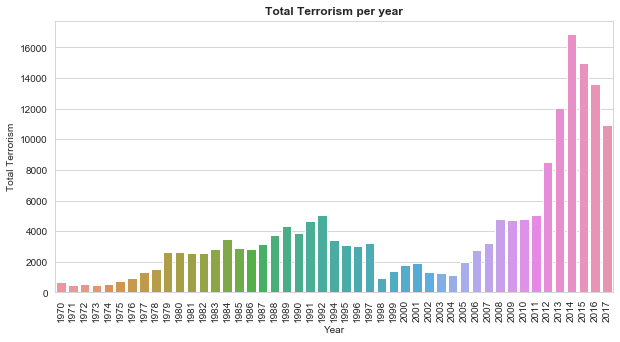

In [49]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
sns.barplot(x = count_by_year.index, y = count_by_year['Country'])
plt.ylabel('Total Terrorism')
plt.xticks(rotation=90)
plt.title('Total Terrorism per year', fontweight='bold')
plt.show()

Trend aksi terorisme global dari tahun ke tahun memiliki kecenderungan semakin meningkat. Lonjakan yang tinggi terlihat pada tahun 2003 sampai mencapai puncaknya tahun 2014. Apa yang sebenarnya terjadi pada tahun-tahun tersebut?

Dari tahun 2015 sampai dengan 2017 aksi terorisme mulai mengalami penurunan.

<b>Tahun- tahun dengan angka terorisme paling tinggi?</b>

In [50]:
df2.Year.value_counts()[:10]

2014    16903
2015    14965
2016    13587
2013    12036
2017    10900
2012     8522
2011     5075
1992     5070
2010     4826
2008     4802
Name: Year, dtype: int64

Terorisme banyak terjadi setelah tahun 2005 ke atas. Hanya satu tahun yang terjadi sebelum tahun 2000 yaitu pada tahun 1992.

<b>Negara-negara dengan angka terorisme paling tinggi?</b>

In [51]:
df2.Country.value_counts()[:10]

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5318
United Kingdom     5235
Turkey             4292
Name: Country, dtype: int64

Negara dengan jumlah terorisme terbanyak berdasarkan dataset ini adalah Iraq. Jumlahnya sangat jauh dari jumlah terorisme di negara kedua yaitu Pakistan dengan selisih hampir 10000 aksi terorisme.

Apa yang sebenarnya terjadi di negara-negara dengan jumlah terorisme terbanyak tersebut?

<b>Grafik Jumlah Teroris 6 Negara dengan jumlah terorisme terbanyak tiap tahunnya</b>

In [52]:
def show_terorism_per_year(country):
    sns.barplot(df2[df2['Country'] == country].groupby('Year').count()['Country'].index, df2[df2['Country'] == country].groupby('Year').count()['Country'].values) 
    plt.xticks(rotation=90)
    plt.title(f'{country}', fontweight='bold')

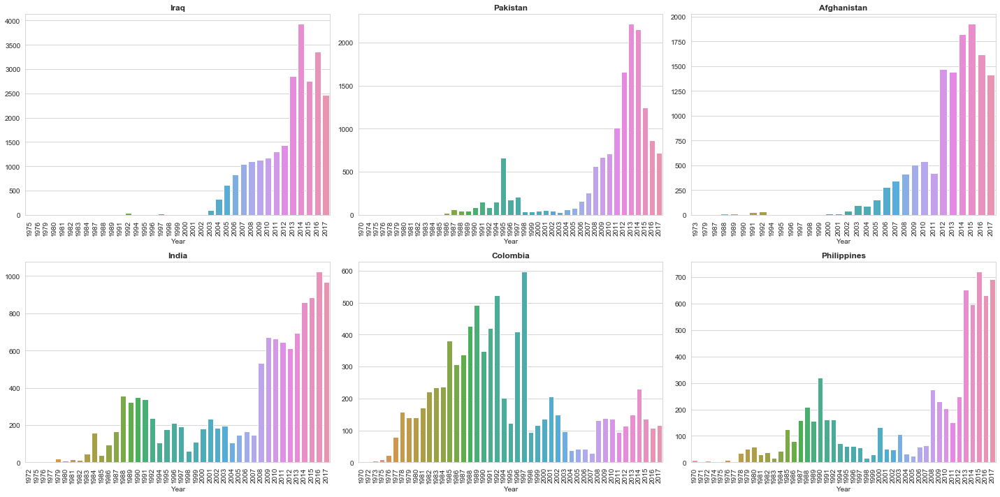

In [53]:
i = 1
plt.figure(figsize=(20,10))
for country in df2.Country.value_counts().index[:6]:
    plt.subplot(2,3, i)
    show_terorism_per_year(country)
    i += 1
plt.tight_layout()
plt.show()

Aksi terorisme di negara Iraq, Pakistan, Afghanistan, dan India serta Philippines mulai meningkat sekitar tahun 2003-2005. Sedangkan terorisme di Colombia banyak terjadi pada tahun 1980 sampai sebelum tahun 2000. 

<b>Aksi Terorisme yang paling banyak menimbulkan korban meninggal paling banyak</b>

In [54]:
max_killed = df2['NumberKill'].max()
df2[df2['NumberKill'] == max_killed]

,Year,Month,Country,Region,Province,City,Lat,Long,AttType,Weapon,TargetType,NatTarget,TerNat,Success,Suicide,GroupName,Individual,NumberKill,NumberWound
133518,2014,6,Iraq,Middle East & North Africa,Saladin,Tikrit,34.621521,43.668377,Hostage Taking (Kidnapping),Firearms,Military,Iraq,1,1,0,Islamic State of Iraq and the Levant (ISIL),0,1570.0,NaN


Aksi terorisme yang paling memakan banyak korban (1570 korban) terjadi pada tahun 2014 di Iraq, kota Tikrit. Target dari serangan ini adalah Militer dari Iraq.

<b>Persentase value dari tiap tiap kolom Kategorikal dengan pie chart</b>

In [55]:
cat_column

['Month',
 'Region',
 'AttType',
 'Weapon',
 'TargetType',
 'TerNat',
 'Success',
 'Suicide',
 'Individual']

In [56]:
list(df2.Weapon.unique())

['Unknown',
 'Explosives',
 'Incendiary',
 'Firearms',
 'Chemical',
 'Melee',
 'Sabotage Equipment',
 'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
 'Fake Weapons',
 'Radiological',
 'Other',
 'Biological']

In [57]:
#Changing Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs) to Vehicle
df2.Weapon.cat.categories = ['Biological', 'Chemical', 'Explosives', 'Fake Weapons', 'Firearms',
       'Incendiary', 'Melee', 'Other', 'Radiological', 'Sabotage Equipment','Unknown','Vehicle']

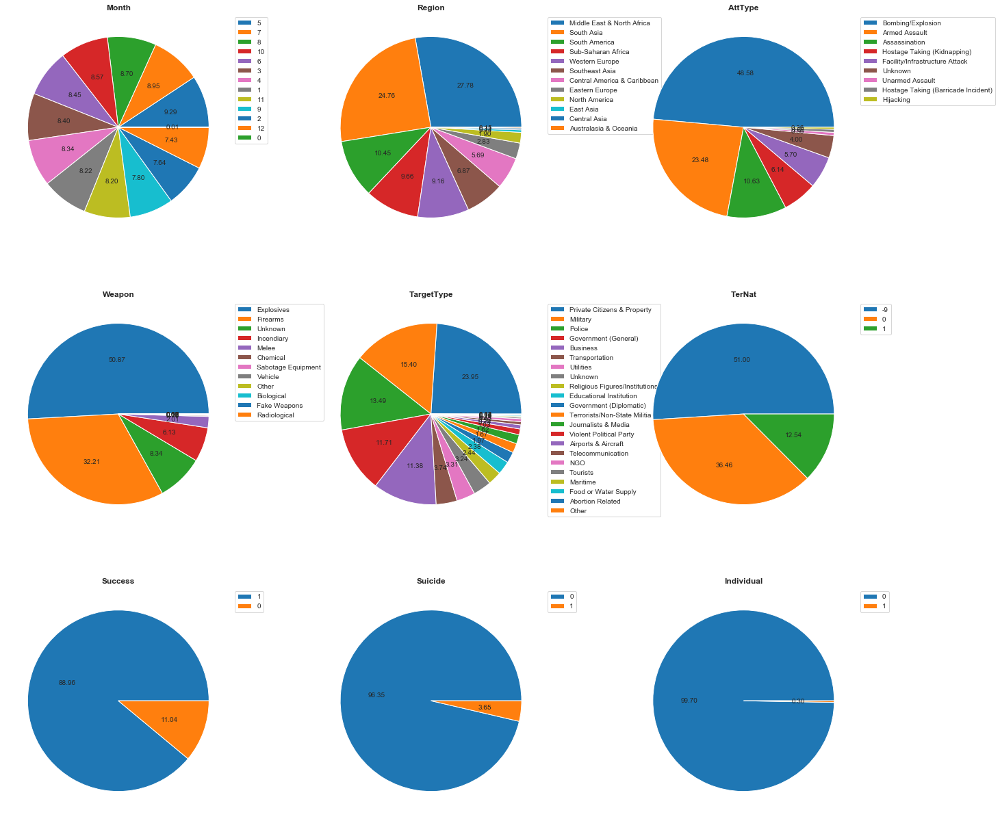

In [58]:
n_row = 3
n_col = 3
fig, axes = plt.subplots(n_row,n_col, figsize=(20,17))
col = 0
for i in range(n_row):
    for j in range(n_col):
        axes[i,j].set_title(cat_column[col], fontweight = 'bold')
        axes[i,j].pie(df2[cat_column[col]].value_counts(), autopct='%.2f')
        axes[i,j].legend(df2[cat_column[col]].value_counts().index, bbox_to_anchor=(1,1,0,0))
        col += 1
plt.tight_layout()

<b>Insight</b>:<br>
Month : Semua bulan memiliki komposisi yang tidak berbeda jauh <br>
Region : Region Middle East & North Africa memiliki komposisi terbanyak, diikuti dengan Region South Asia dan South America. Hal ini sesuai dengan negara yang paling banyak mengalami aksi terorisme yaitu Iraq di daerah Middle East. Pakistan, Afghanistan dan India di daerah Asia Selatan, dan Colombia untuk daerah Amerika Selatan.<br>
AttType : Hampir setengah dari kasus terorisme dilakukan dengan cara melakukan pengeboman (Bomb explosion). Diikuti dengan Pembunuhan bersenjata dan Assasination.<br>
Weapon : Setengah senjata yang digunakan dari seluruh kejadian terorisme di dunia dilakukan dengan menggunakan bahan peledak. Hal ini seiring dengan tipe penyerangan yang melakukan pengeboman. Senjata yang sering digunakan setelah bahan peledak adalah senjata api.<br>
TargetType : Target dari aksi terorisme global hampir 25 persen adalah perorangan. Kemudian, militer dan polisi.<br>
TerNat : Kebanyakan nationality dari teroris tidak diketahui, 30% teroris memiliki kewarganegaraan yang sama dengan target, dan 12% kewarganegaraan teroris berbeda dengan kewarganegaraan targetnya. <br>
Success : 89% aksi terorisme global berhasil dilakukan. <br>
Suicide : 96% aksi terorisme bukan merupakan aksi bunuh diri. <br>
Individual : Hampir seluruh aksi terorisme dilakukan secara kelompok. Hanya 0.03% saja yang aksi terorismenya merupakan aski individual.

<b>Group Teroris yang paling banyak melakukan aksi terorisme</b>

In [59]:
df2['GroupName'].value_counts(normalize=True).head()

Unknown                                             0.455612
Taliban                                             0.041163
Islamic State of Iraq and the Levant (ISIL)         0.030897
Shining Path (SL)                                   0.025073
Farabundo Marti National Liberation Front (FMLN)    0.018435
Name: GroupName, dtype: float64

Ternyata sangat banyak aksi terorisme yang tidak diketahui siapa yang melakukannya, hampir setengah kejadian terorisme tidak diketahui siapa pelakunya. Group yang terbanyak kedua adalah Taliban di Afghanistan dengan komposisi 0.04, dan dilanjutkan dengan ISIL di daerah Iraq denga komposisi 0.03

<b>Apakah terdapat korelasi antara jumlah orang meninggal dengan jumlah orang yang terluka</b>

In [60]:
df2[['NumberWound', 'NumberKill']].corr()

,NumberWound,NumberKill
NumberWound,1.000000,0.534374
NumberKill,0.534374,1.000000


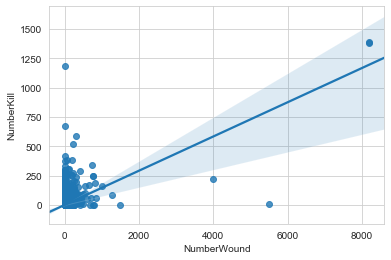

In [61]:
sns.regplot(x='NumberWound', y='NumberKill', data=df2, )

Korelasi antara NumberKill dan NumberWound ternyata positif. Semakin banyak NumberKill maka NumberWound juga akan semakin banyak.

<b>Negara Apa saja yang aksi terorismenya pernah menggunakan Senjata Biologi</b>

In [62]:
df2[df2['Weapon']=='Biological']['Country'].value_counts(normalize=True).head()

United States     0.685714
Kenya             0.085714
Pakistan          0.057143
Japan             0.057143
United Kingdom    0.057143
Name: Country, dtype: float64

Negara yang aksi terorismenya paling banyak menggunakan Senjata Biologis adalah Amerika Serikat

In [63]:
df2[df2['Country']=='United States'].TerNat.value_counts(normalize=True)

-9    0.508110
 0    0.316643
 1    0.175247
Name: TerNat, dtype: float64

Teroris yang melakukan aksinya di Amerika Serikat kebanyakan tidak diketahui Nationalitynya, 31% dari teroris yang ada memiliki kewarganegaraan Amerika Serikat, dan 17% bukan kewarganegaraan Amerika Serikat.

<b> Apa yang terjadi dengan Iraq ? </b>

In [64]:
df2.Country.value_counts(normalize=True)[:10]

Iraq              0.135609
Pakistan          0.079088
Afghanistan       0.070078
India             0.065834
Colombia          0.045720
Philippines       0.038025
Peru              0.033555
El Salvador       0.029273
United Kingdom    0.028816
Turkey            0.023625
Name: Country, dtype: float64

13% Kejadian terorisme global terjadi di Iraq apa yang sebenarnya terjadi pada negara ini?

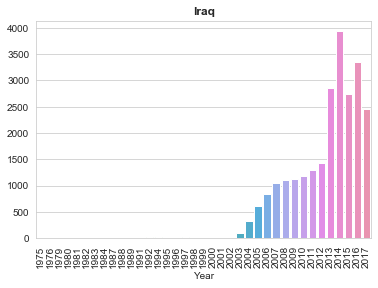

In [65]:
show_terorism_per_year('Iraq')

Kejadian terorisme baru marak terjadi di Negara ini semenjak tahun 2003, dan semakin meningkat di tahun-tahun berikutnya. Apa yang terjadi pada tahun 2003 di Iraq? <br>
<img src="iraq_2003.png">
<br>
Ternyata terjadi invasi Amerika Serikat dengan para sekutunya di Iraq pada tahun ini. Presiden US saat itu, George W. Bush mengatakan bahwa invasi ini bertujuan untuk menghancurkan senjata pemusnah masal yang dikembangkan di Iraq dan mengakhiri kepemimpinan Saddam Husein yang mendukung aksi terorisme.

Ironisnya, maksud US untuk menghentikan terorisme dan menciptakan kedamaian malah berujung semakin bertumbuh pesatnya kejadian terorisme di kawasan itu. 

<b>Bagaimana Kondisi di kawasan Asia Tenggara selama 10 tahun ke belakang?</b>

In [66]:
df_asia_tenggara = df2[df2['Region']=='Southeast Asia']

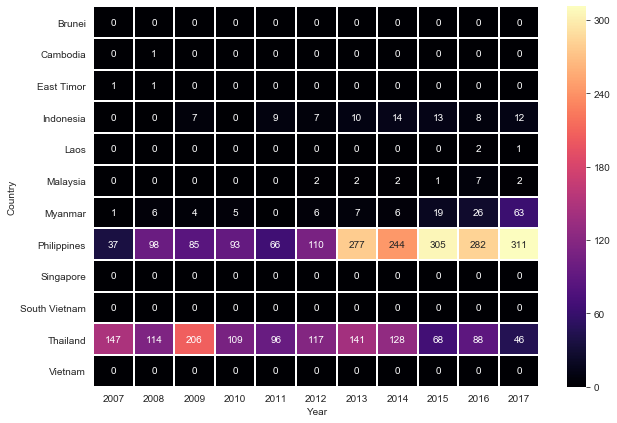

In [67]:
plt.figure(figsize=(10,7))
sns.heatmap(df_asia_tenggara.pivot_table(columns='Year', index='Country', values='NumberKill', aggfunc=np.count_nonzero, fill_value=0
                            ).loc[:, 2007:], linewidths=1, cmap='magma', annot=True, fmt='.0f' )

Diantara negara-negara di Asia Tenggara. Negara yang mengalami aksi terorisme paling banyak dalam 10 tahun terakhir ini adalah Filipina dan Thailand. Aksi terorisme di filipina bahkan meningkat cukup signifikan pada tahun 2013. Apa yang terjadi pada Filipina?

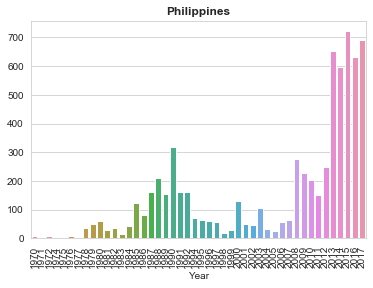

In [68]:
show_terorism_per_year('Philippines')

In [69]:
df_filipina = df2[df2['Country'] == 'Philippines']
df_filipina[df_filipina['Year'] >= 2013].GroupName.value_counts().head()

New People's Army (NPA)                       1351
Unknown                                       1165
Bangsamoro Islamic Freedom Movement (BIFM)     363
Abu Sayyaf Group (ASG)                         286
Maute Group                                     31
Name: GroupName, dtype: int64

Banyak terjadi terorisme yang digerakan oleh group yang disebut dengan NPA(New People's Army) di Filipina. <br>
<img src="Npa.png">
<br>
<img src="Npa2.png">

## Terorisme di Indonesia

<b>Membersihkan data untuk Indonesia</b>

In [83]:
# geopy harus di install terlebih dahulu (pip install geopy)
from geopy.distance import geodesic

In [84]:
def indoisland(df):
    a=False
    for i in ['Java','Jawa','Jakarta','Banten','Yogya']:
        if i in df['Province']: 
            return 'Java'
            a=True
            break
    for i in ['Sumatera','Riau','Aceh','Sumatra','Lampung']:
        if i in df['Province']: 
            return 'Sumatera'
            a=True
            break
    for i in ['Papua','Irian']:
        if i in df['Province']: 
            return 'Papua'
            a=True
            break
    for i in ['Sulawesi','sulawesi']:
        if i in df['Province']: 
            return 'Sulawesi'
            a=True
            break
    for i in ['Bali','Nusa']:
        if i in df['Province']: 
            return 'Bali Nusa'
            a=True
            break
    for i in ['Timor','Timur']:
        if i in df['Province']: 
            return 'Timur-timur'
            a=True
            break
    for i in ['Maluku','Ambon']:
        if i in df['Province']: 
            return 'Maluku'
            a=True
            break
    if 'Kalimantan' in df['Province']: 
        return 'Kalimantan'
    elif a==False :
        return np.nan

In [85]:
df_indo['Island']=df_indo.apply(indoisland,axis=1)

C:\Users\Elga Ridho Maulana\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [86]:
df_indo_island=df_indo[df_indo['Island'].notnull()]
def indoisland2(df):
    if pd.notnull(df['Island']):
        return df['Island']
    else :
        distance=[]
        origin = (df['Lat'],df['Long'])
        for i in range(len(df_indo_island)):
            dist = (df_indo_island['Lat'].iloc[i],df_indo_island['Long'].iloc[i])
            distance.append(geodesic(origin, dist).kilometers)
        idx=np.argmin(distance)
        return df_indo_island['Island'].iloc[idx]

In [87]:
df_indo['Island']=df_indo.apply(indoisland2,axis=1)

C:\Users\Elga Ridho Maulana\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



<b>Eksplor Data Indonesia</b>

In [89]:
listlatlong=[]
for index,value in df_indo.iterrows():
    temp=[value['Lat'],value['Long']]
    listlatlong.append(temp)

In [90]:
import folium
from folium.plugins import HeatMap
map_indo1 = folium.Map(location= [ -0.8789, 113.9502], zoom_start=5,tiles='Stamen Toner')
map_indo1.add_child(folium.LatLngPopup())
map_indo1

HeatMap(data=listlatlong,radius=20).add_to(map_indo1)
map_indo1

# Banyak aksi Terorisme tiap Pulau
## dan kelompok teror nya

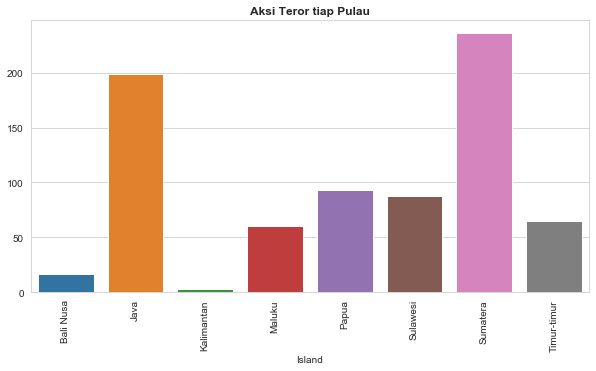

In [105]:
plt.figure(figsize=(10,5))
sns.barplot(df_indo.groupby('Island').count()['City'].index, df_indo.groupby('Island').count()['City'].values )
plt.xticks(rotation=90)
plt.title('Aksi Teror tiap Pulau', fontweight='bold')
plt.show()

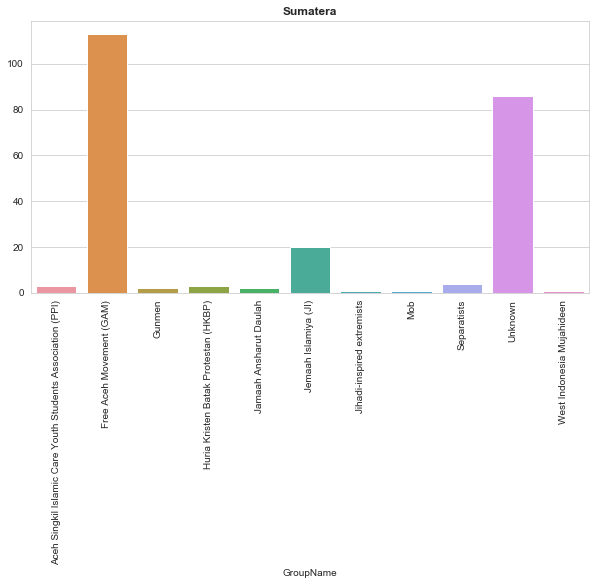

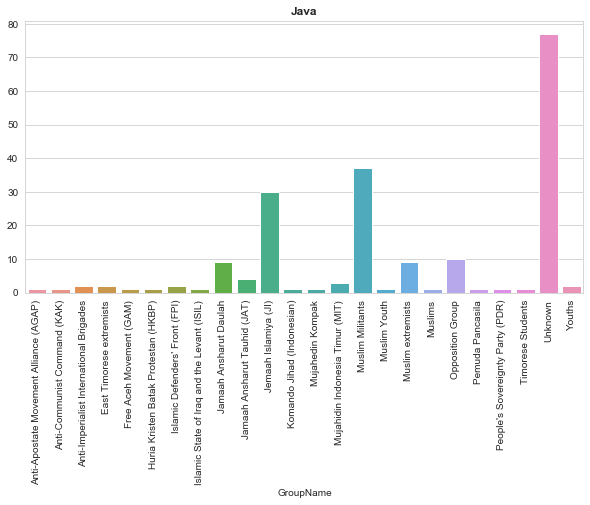

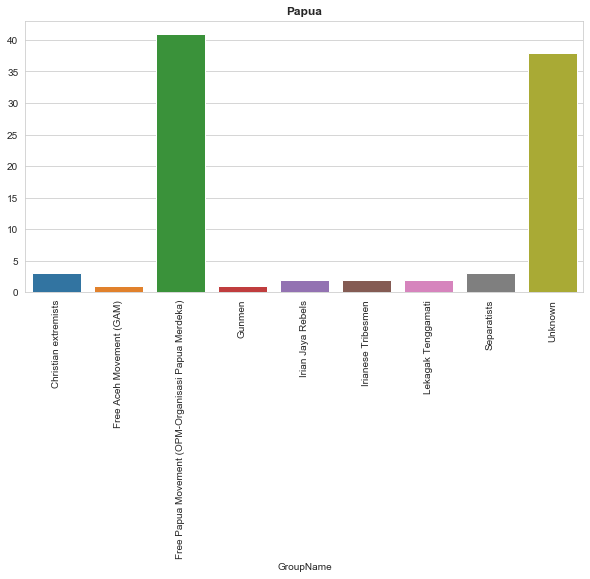

In [106]:
most_island=df_indo['Island'].value_counts().head(3).index
for island in most_island:
    plt.figure(figsize=(10,5))
    sns.barplot(df_indo.groupby(['Island','GroupName']).count()['Year'].loc[island].index,df_indo.groupby(['Island','GroupName']).count()['Year'].loc[island].values)
    plt.xticks(rotation=90)
    plt.title(island, fontweight='bold')
    plt.show()

# Number Kill Tiap Pulau
## pelaku Teror dan aksi terornya

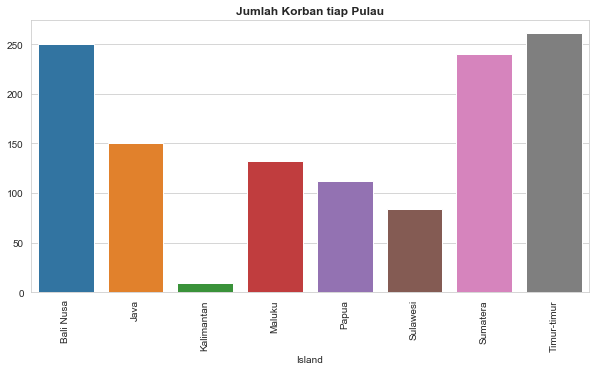

In [101]:
plt.figure(figsize=(10,5))
sns.barplot(df_indo.groupby('Island').sum()['NumberKill'].index, df_indo.groupby('Island').sum()['NumberKill'].values )
plt.xticks(rotation=90)
plt.title('Jumlah Korban tiap Pulau', fontweight='bold')
plt.show()

In [94]:
df_indo.groupby(['Island','GroupName']).sum()['NumberKill'].loc['Bali Nusa']

GroupName
Jamaah Ansharut Daulah      0.0
Jemaah Islamiya (JI)      227.0
Militia Members             0.0
Unknown                    23.0
Name: NumberKill, dtype: float64

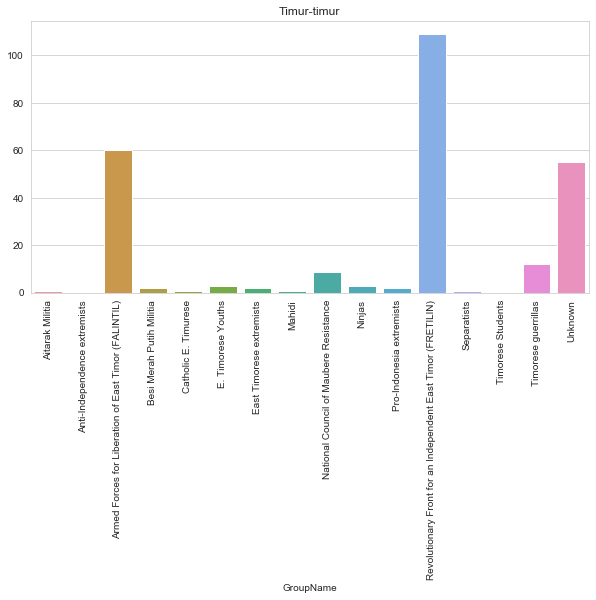

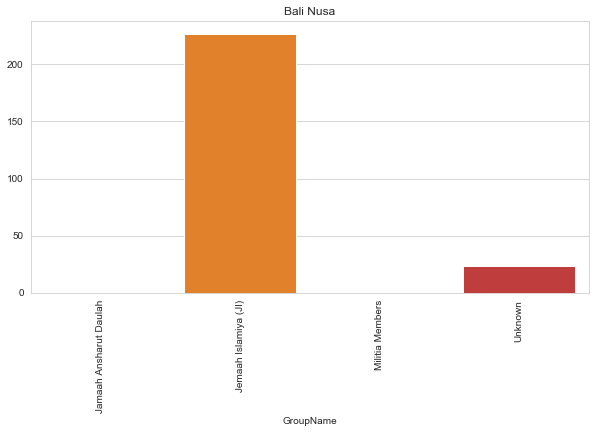

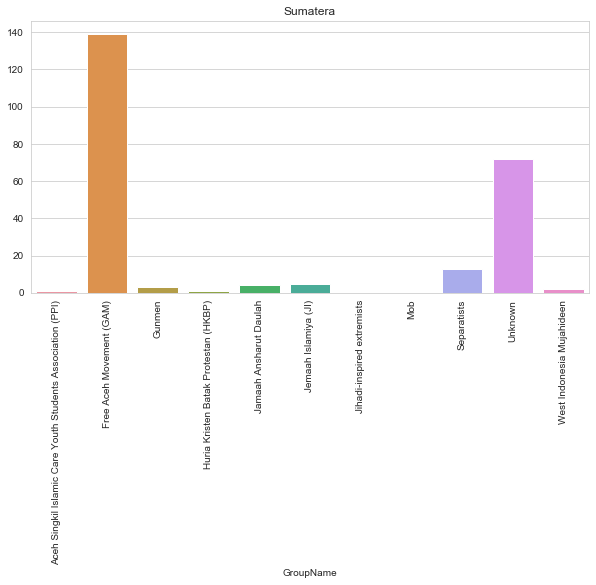

In [102]:
for island in df_indo.groupby('Island').sum()['NumberKill'].sort_values(ascending=False).head(3).index:
    plt.figure(figsize=(10,5))
    sns.barplot(df_indo.groupby(['Island','GroupName']).sum()['NumberKill'].loc[island].index,df_indo.groupby(['Island','GroupName']).sum()['NumberKill'].loc[island].values)
    plt.xticks(rotation=90)
    plt.title(island)
    plt.show()

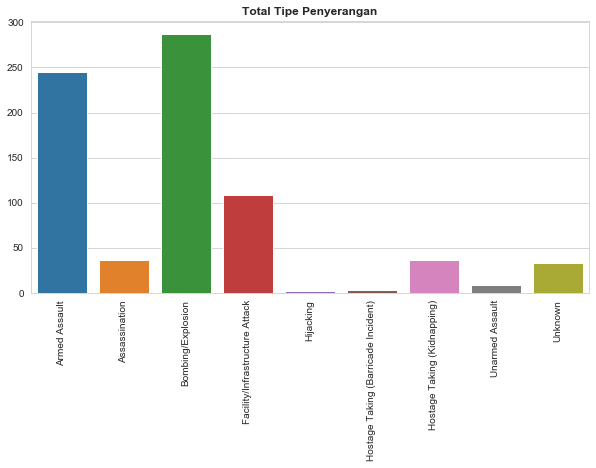

In [103]:
plt.figure(figsize=(10,5))
sns.barplot(df_indo['AttType'].value_counts().index,df_indo['AttType'].value_counts().values )
plt.xticks(rotation=90)
plt.title('Total Tipe Penyerangan', fontweight='bold')
plt.show()

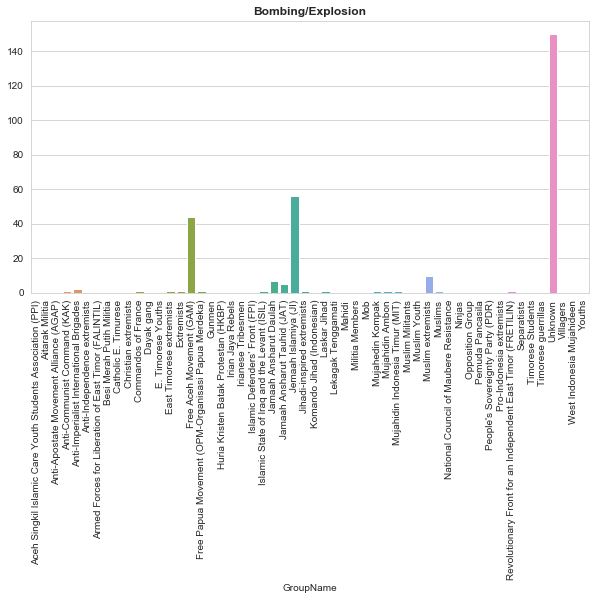

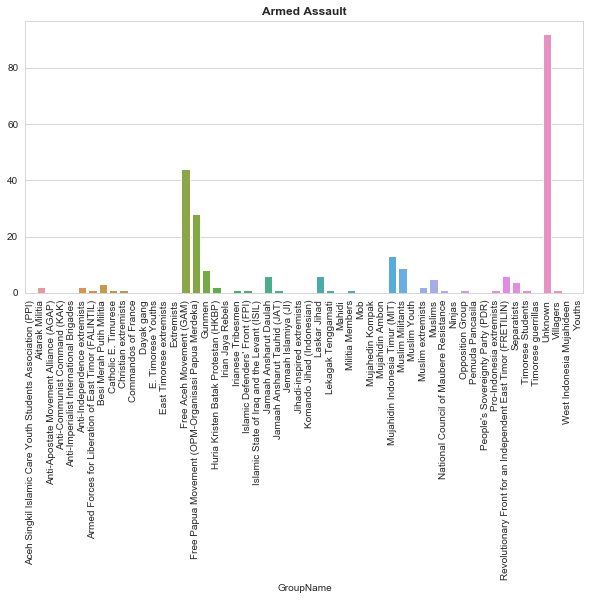

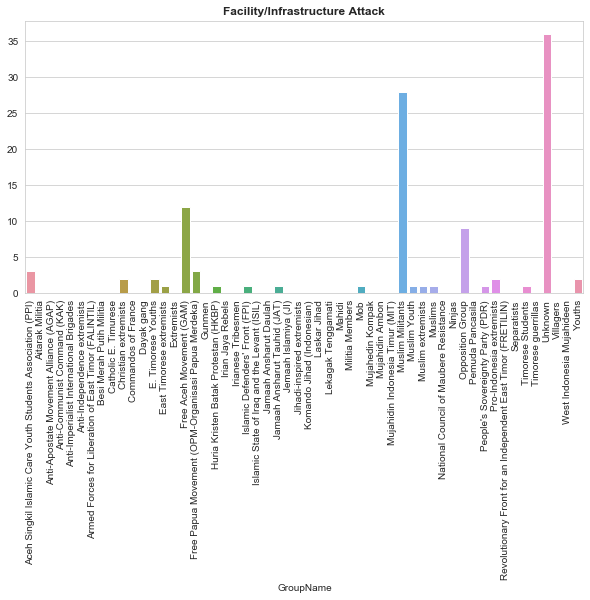

In [104]:
for att in df_indo['AttType'].value_counts().head(3).index:
    plt.figure(figsize=(10,5))
    sns.barplot(df_indo.groupby(['AttType','GroupName']).count().loc[att]['Year'].index,df_indo.groupby(['AttType','GroupName']).count().loc[att]['Year'].values)
    plt.xticks(rotation=90)
    plt.title(att, fontweight='bold')
    plt.show()